# Manipulating Images 

In this section we will manipulate images both as arrays ans PIL image objects. We will copy an image to avoid aliasing.
 We will cover flipping images and cropping images. we will also change pixel images; this will allow us to draw shapes, write text and superimpose images over other images.

What manipuate images inpludes:

<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

--2024-07-21 16:35:16--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 198.23.119.245
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|198.23.119.245|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 663451 (648K) [image/png]
Saving to: ‘cat.png’

cat.png             100%[===================>] 647.90K   416KB/s    in 1.6s    

2024-07-21 16:35:20 (416 KB/s) - ‘cat.png’ saved [663451/663451]

--2024-07-21 16:35:20--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.

In [2]:
# Libraries
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

## Copying Images


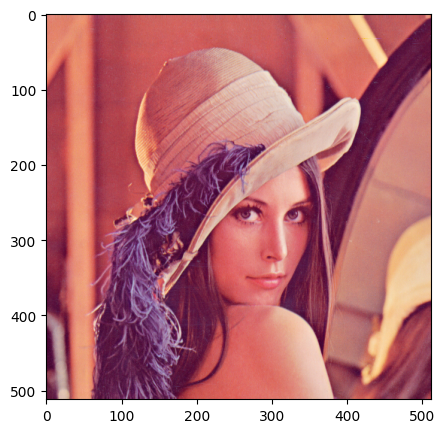

In [3]:
lenna = np.array(Image.open('lenna.png'))
plt.figure(figsize=(5,5))
plt.imshow(lenna)
plt.show()

While coping if we do not apply the method copy(), the two variables would point to the same location in memory.

Let's check that with code


In [4]:
A = lenna

In [5]:
# We use the id function to find a variable's memory address; we see the objects in the memory space which the variables A and baboon point to are the same.

id(A) == id(lenna)

True

However, if we apply method copy(), their memory addresses are different.

In [6]:
B = lenna.copy()
id(B)==id(lenna)

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `lenna`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `lenna` and `B` points to different objects, the values in `B` will not be affected. 


In [10]:
lenna[:,:,] = 0

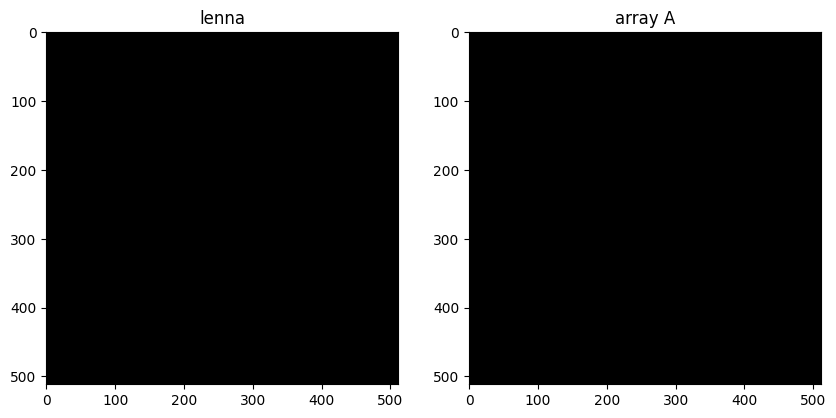

In [11]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(lenna)
plt.title("lenna")
plt.subplot(122)
plt.imshow(A)
plt.title("array A")
plt.show()

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>lenna</code> and array <code>B</code>:


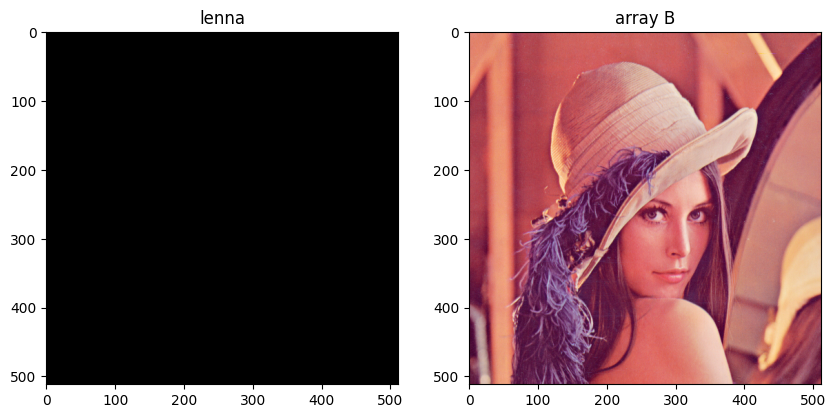

In [12]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(lenna)
plt.title("lenna")
plt.subplot(122)
plt.imshow(B)
plt.title("array B")
plt.show()

## Flipping Images

Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


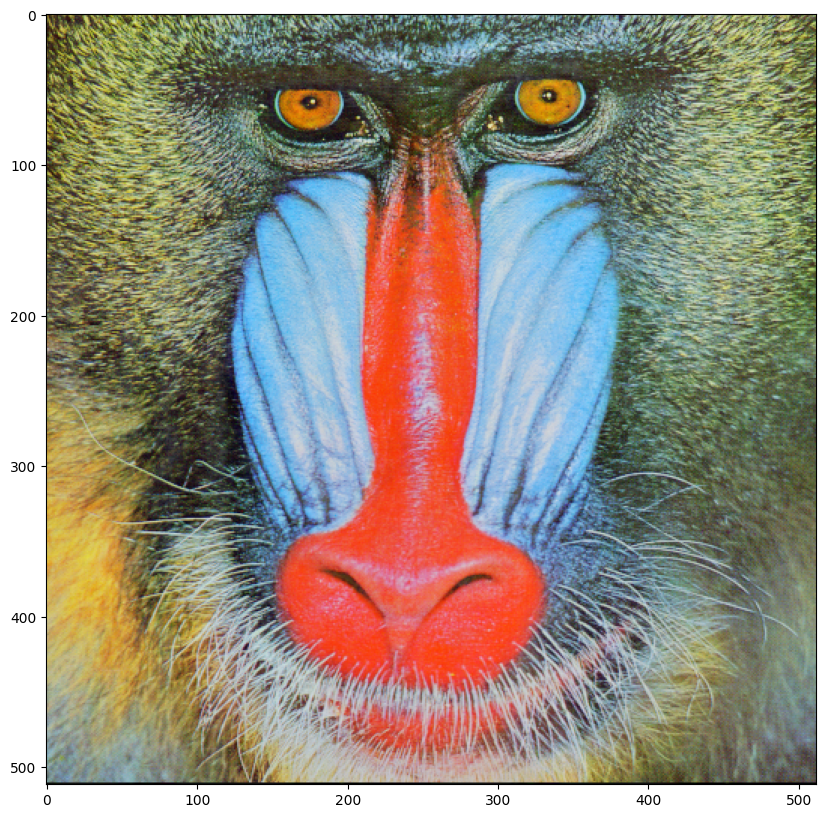

In [13]:
image = Image.open("baboon.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [16]:
# We can cast it to an array and find its shape:

array = np.array(image)

width, height, C = array.shape

print('width, height, C', width, height, C)

width, height, C 512 512 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype np.uint8.


In [15]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, array_flip will become the flipped image. 

In [17]:
for i,row in enumerate(array):
    array_flip[width - 1 - i, :, :] = row

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [18]:
from PIL import ImageOps

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


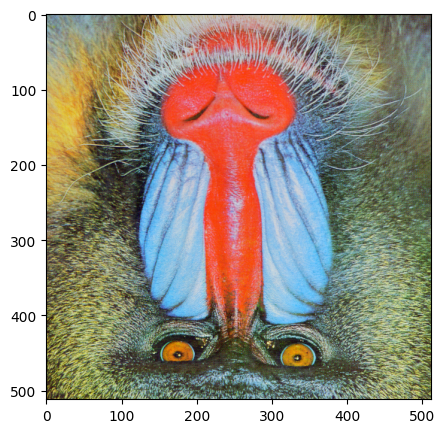

In [19]:
im_flip = ImageOps.flip(image)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

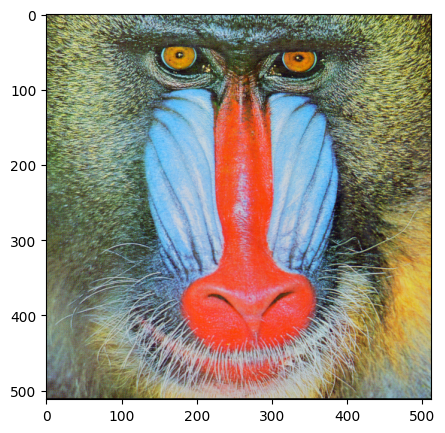

In [20]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

We can use the `transpose()` method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of 1.

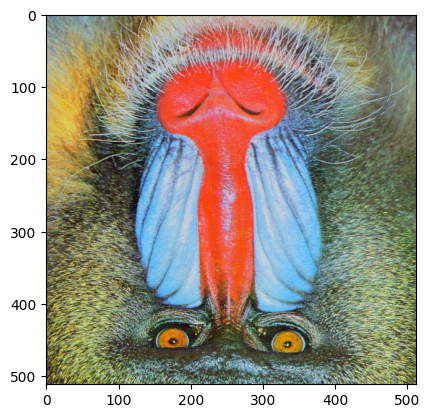

In [21]:
im_flip = image.transpose(1)
plt.imshow(im_flip)
plt.show()

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [22]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE, 
        "TRANSVERSE": Image.TRANSVERSE}

In [23]:
flip["FLIP_LEFT_RIGHT"]

0

We can plot each of the outputs using the different parameter values:


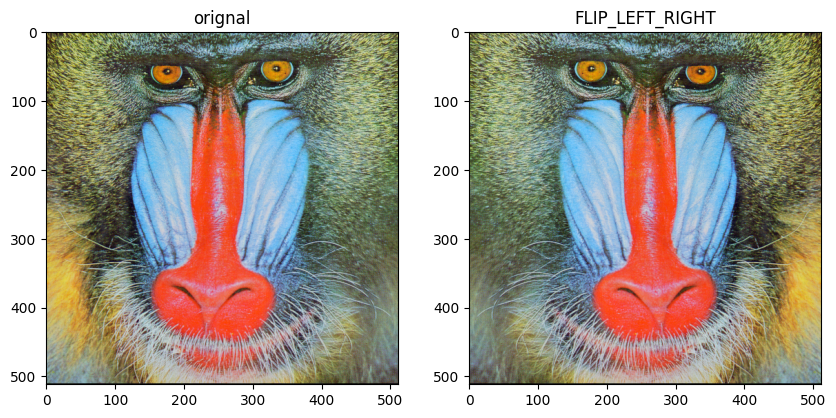

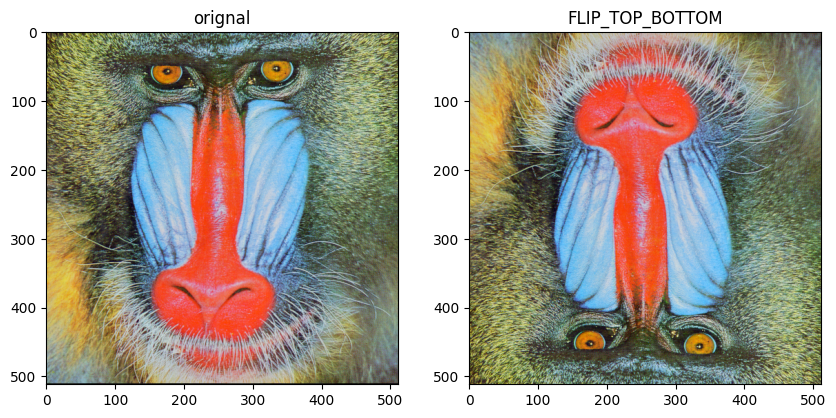

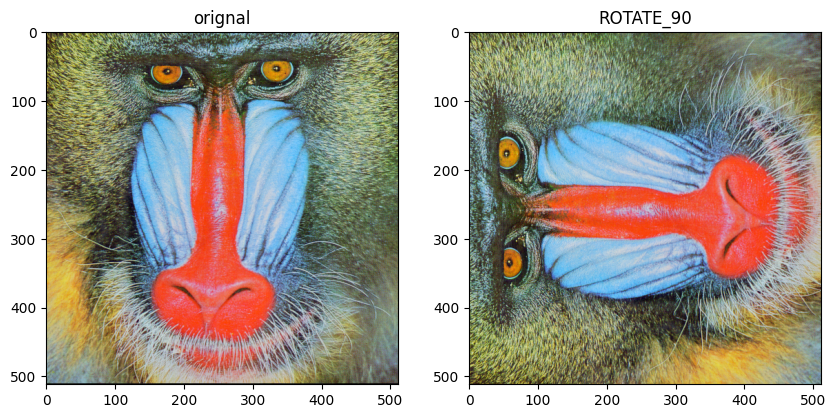

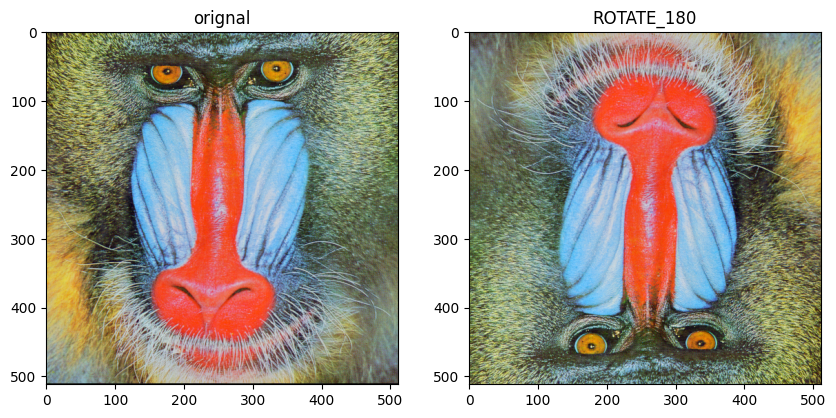

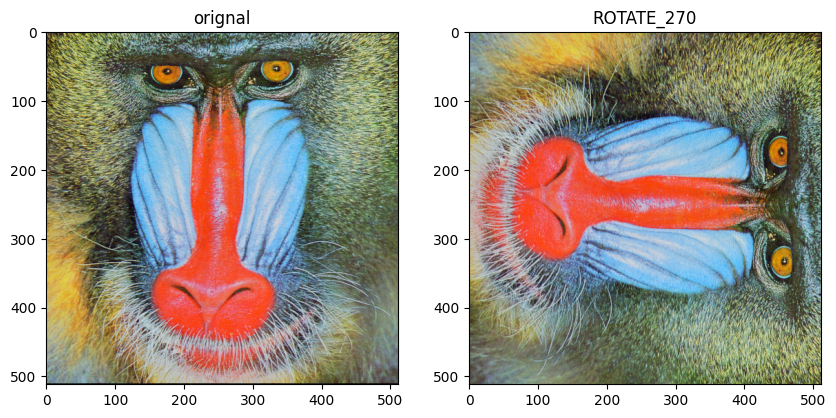

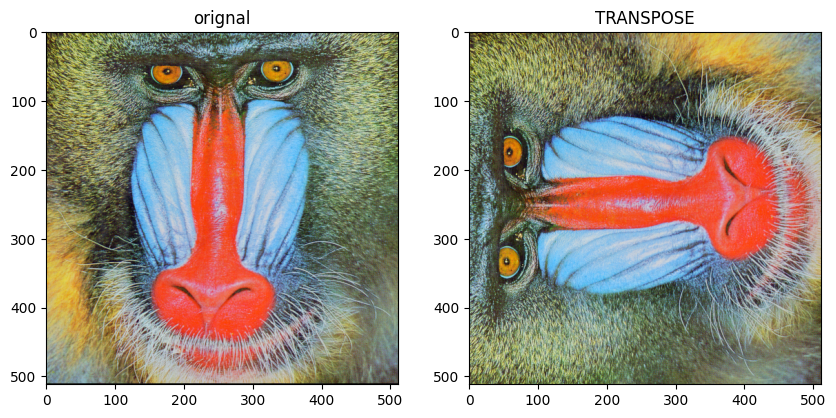

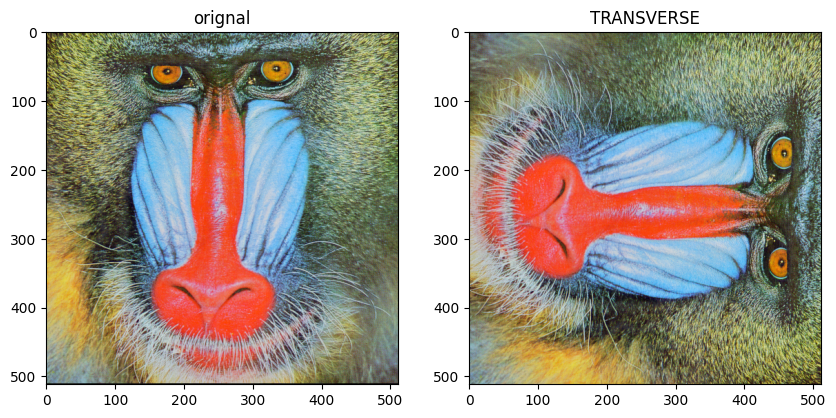

In [24]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

## Cropping an Image

Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing.

Let start with a vertical crop: the variable upper is the index of the first row that we would like to include in the image, the variable lower is the index of the last row we would like to include. We then perform array slicing to obtain the new image.


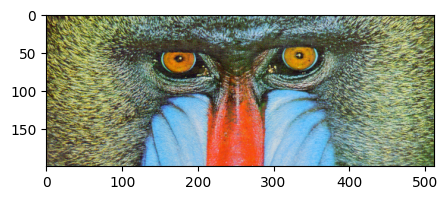

In [30]:
upper = 0
lower = 200
crop_top = array[upper : lower,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


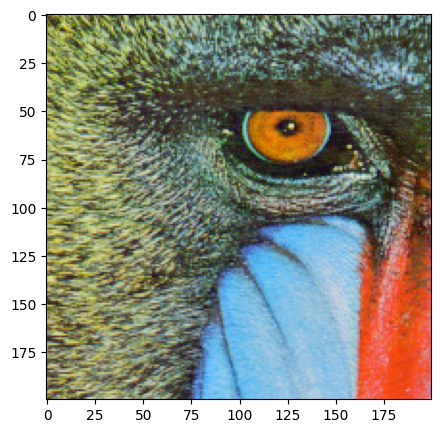

In [33]:
left = 50
right = 250
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


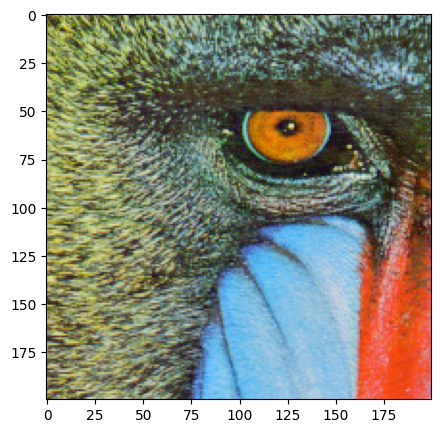

In [36]:
image = Image.open("baboon.png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

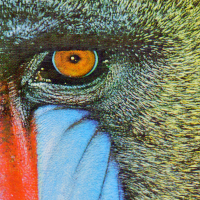

In [37]:
# We can also flip the new image:

crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)

crop_image

## Changing Specific Image Pixels

We can change specific image pixels using array indexing; for example, we can set all the green and blue channels in the original image we cropped to zero:


In [38]:
array_sq = np.copy(array)
array_sq[upper:lower, left:right, 1:2] = 0

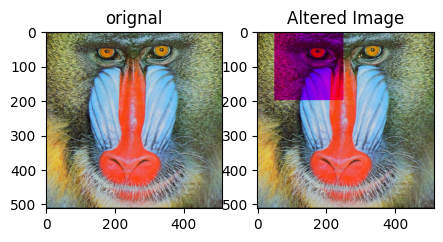

In [39]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

In [40]:
# We can also use the ImageDraw module from PIL library, which provides simple 2D graphics for Image objects

from PIL import ImageDraw 

In [41]:
image_draw = image.copy()

The draw constructor creates an object that can be used to draw in the given image. The input im is the image we would like to draw in.


In [43]:
image_fn = ImageDraw.Draw(im = image_draw)

Whatever method we apply to the object image_fn, will change the image object image_draw.

We can draw a rectangle using the rectangle function, two important parameters include: xy – the coordinates bounding box and fill – Color of the rectangle.


In [44]:
shape = [left, upper, right, lower]
image_fn.rectangle(xy=shape, fill='red')

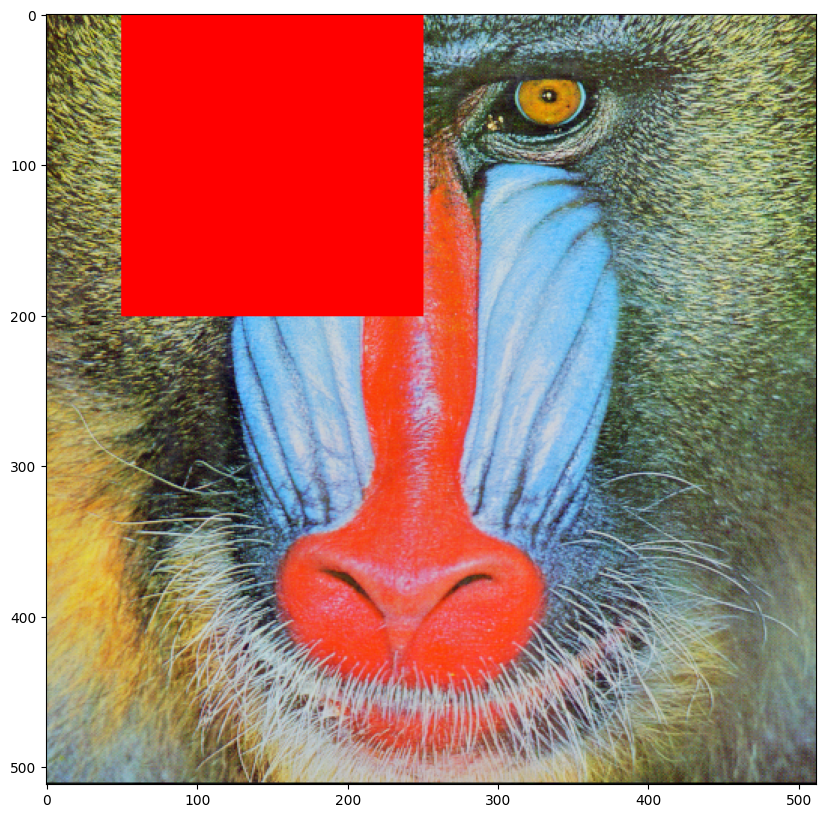

In [45]:
# plot
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

We use the text method to place the text on the image. The parameters include xy (the top-left anchor coordinates of the text), the parameter text (the text to be drawn), and fill (the color to use for the text).


In [46]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))

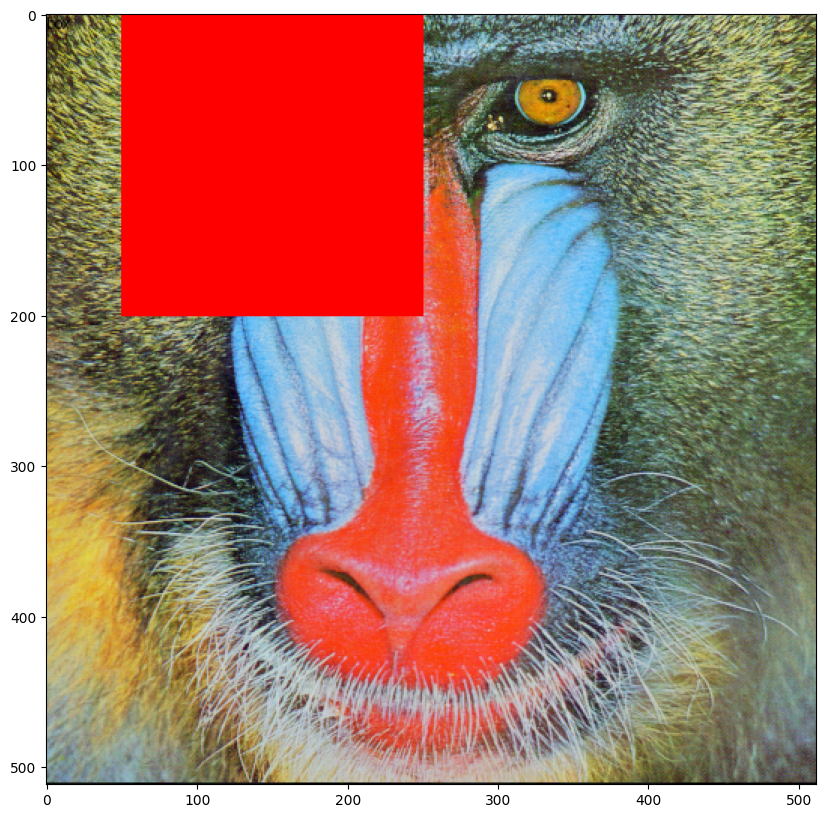

In [47]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [50]:
image_cat = Image.open("cat.png")
array_cat = np.array(image_cat)

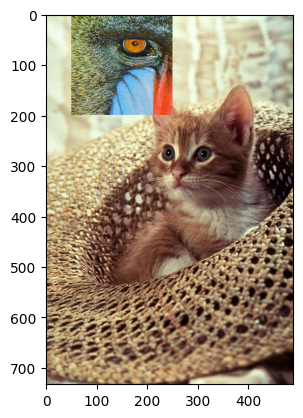

In [51]:
array_cat[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_cat)
plt.show()

In [52]:
# using paste method
image_cat.paste(crop_image, box=(left,upper))

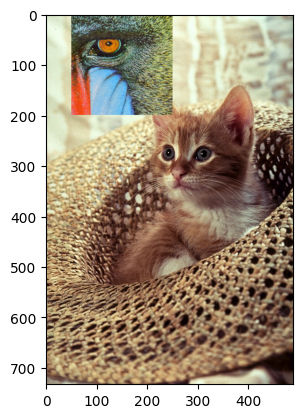

In [55]:
plt.imshow(image_cat)
plt.show()

In [60]:
image = Image.open("baboon.png")
new_image=image
copy_image=image.copy()

If we change the object image, new_image will change, but copy_image will remain the same:


In [61]:
image_fn= ImageDraw.Draw(im=image)
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
image_fn.rectangle(xy=shape,fill="red")

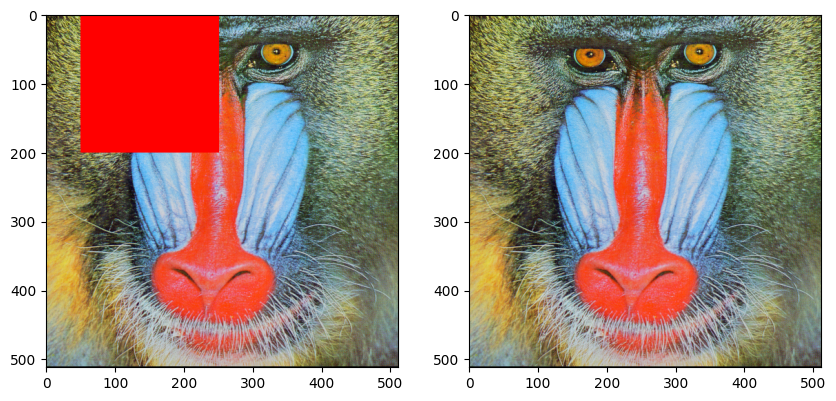

In [62]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()